In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

# EDA


In [3]:
salesdata = pd.read_excel('10000_sales_data.xlsx')
salesdata.head()

,Product Name,Price,Brand,Category,Description,Rating,Review Count,Style Attributes,Total Sizes,Available Sizes,Color,Purchase History,Age,Fashion Magazines,Fashion Influencers,Season,Time Period Highest Purchase,Customer Reviews,Social Media Comments,feedback
0,T5D3,97.509966,Ralph Lauren,Footwear,Bad,1.421706,492,Streetwear,"M, L, XL",XL,Green,Medium,24,Vogue,Chiara Ferragni,Fall/Winter,Daytime,Mixed,Mixed,Other
1,Y0V7,52.341277,Ted Baker,Tops,Not Good,1.037677,57,Vintage,"M, L, XL",XL,Black,Above Average,61,Glamour,Leandra Medine,Winter,Weekend,Negative,Neutral,Other
2,N9Q4,15.430975,Jigsaw,Footwear,Very Bad,3.967106,197,Streetwear,"S, M, L",M,Blue,Average,27,Marie Claire,Gigi Hadid,Summer,Nighttime,Unknown,Negative,Neutral
3,V2T6,81.116542,Alexander McQueen,Outerwear,Not Good,2.844659,473,Formal,"S, M, L",L,Red,Very High,50,Marie Claire,Chiara Ferragni,Fall/Winter,Weekend,Neutral,Other,Other
4,S7Y1,31.633686,Tommy Hilfiger,Bottoms,Very Good,1.183242,55,Sporty,"M, L, XL",S,Green,Above Average,23,Glamour,Song of Style,Spring,Daytime,Positive,Mixed,Positive


In [4]:
#info about each variable in dataset
salesdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Product Name                  9999 non-null   object 
 1   Price                         9999 non-null   float64
 2   Brand                         9999 non-null   object 
 3   Category                      9999 non-null   object 
 4   Description                   9999 non-null   object 
 5   Rating                        9999 non-null   float64
 6   Review Count                  9999 non-null   int64  
 7   Style Attributes              9999 non-null   object 
 8   Total Sizes                   9999 non-null   object 
 9   Available Sizes               9999 non-null   object 
 10  Color                         9999 non-null   object 
 11  Purchase History              9999 non-null   object 
 12  Age                           9999 non-null   int64  
 13  Fas

In [5]:
#stat overview for selected numerical variable:price,rating, age
salesdata[['Rating','Price','Age']].describe()

,Rating,Price,Age
count,9999.000000,9999.000000,9999.000000
mean,2.997861,54.771314,41.082808
std,1.154996,26.063550,13.453406
min,1.000196,10.010835,18.000000
25%,1.989198,31.876388,29.000000
50%,2.983680,54.864640,41.000000
75%,3.996048,77.285587,53.000000
max,4.999980,99.987600,64.000000


In [ ]:
#rating-distruibution of rating is wide with a standard deviation of 1.15. It is good that the mean is 2.997 which is more reflective of people's sentiments
#instead of it being quite high,as consumer sometimes don't review accurately.
#price-price is also widely distributed with a standard deviation of 26.06 showing the varied buying power of the population
#age-max age is relatively young at 64 with the mea customer in in their middle ages

In [21]:
#stat overview for selected categorical variables:Color,Season,Category,Style Attributes
salesdata[['Color','Category','Style Attributes','Season','Brand']].describe()

,Color,Category,Style Attributes,Season,Brand
count,9999,9999,9999,9999,9999
unique,4,10,10,6,8
top,Red,Activewear,Bohemian,Fall/Winter,Alexander McQueen
freq,2534,1098,1063,1689,1298


In [10]:
#color-the dataset only contains 4 colours, so it is quite limited
#category-10 different categories with active wear being the most popular
#style attributes-10 different styles, will be useful if we can predict style attributes based on target market
#Season-most bought period is during the fall/winter
#dataset missing gender data 

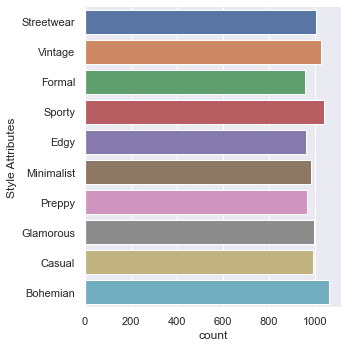

In [14]:
#histogram of categorical variables
sb.catplot(y = 'Style Attributes', data = salesdata, kind = "count")

In [ ]:
#its a even spread of purchases in each style attribute, no significantly higher attribute

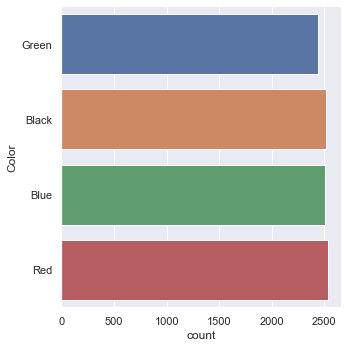

In [15]:
sb.catplot(y = 'Color', data = salesdata, kind = "count")

In [ ]:
#low green and high red, but too little colours

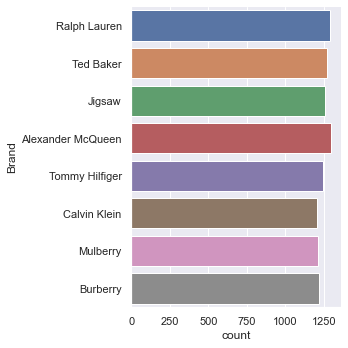

In [22]:

sb.catplot(y = 'Brand', data = salesdata, kind = "count")

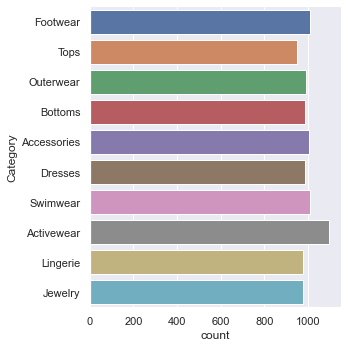

In [16]:
#histogram for category
sb.catplot(y = 'Category', data = salesdata, kind = "count")

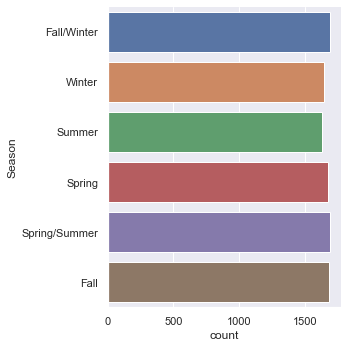

In [18]:
#histogram for age
sb.catplot(y = 'Season', data = salesdata, kind = "count")


<AxesSubplot:xlabel='Age', ylabel='Count'>

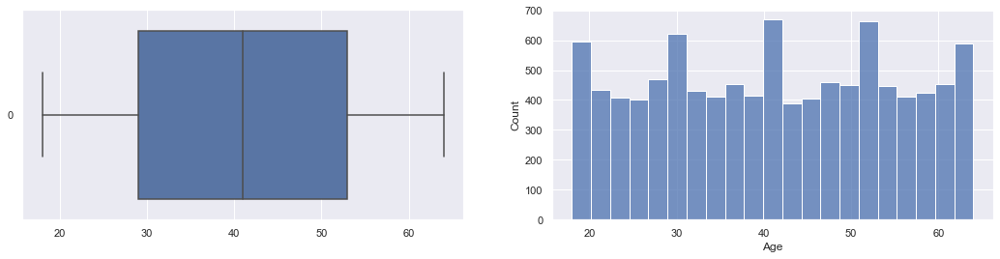

In [19]:
#visualisation for numeric variables
#age
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = salesdata['Age'], orient = "h", ax = axes[0])
sb.histplot(data = salesdata['Age'], ax = axes[1])

<AxesSubplot:xlabel='Price', ylabel='Count'>

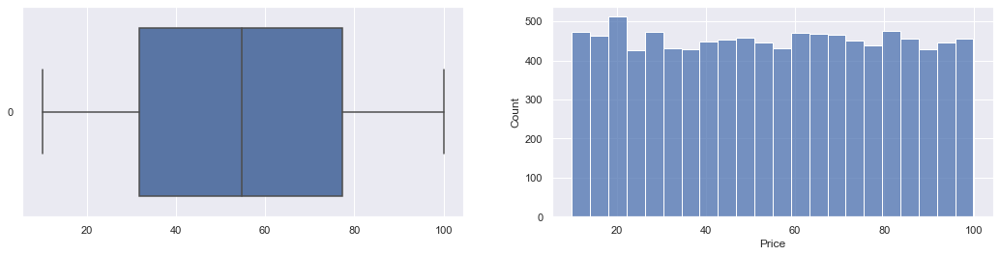

In [20]:
#visualisation for Price
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = salesdata['Price'], orient = "h", ax = axes[0])
sb.histplot(data = salesdata['Price'], ax = axes[1])

<AxesSubplot:xlabel='Rating', ylabel='Count'>

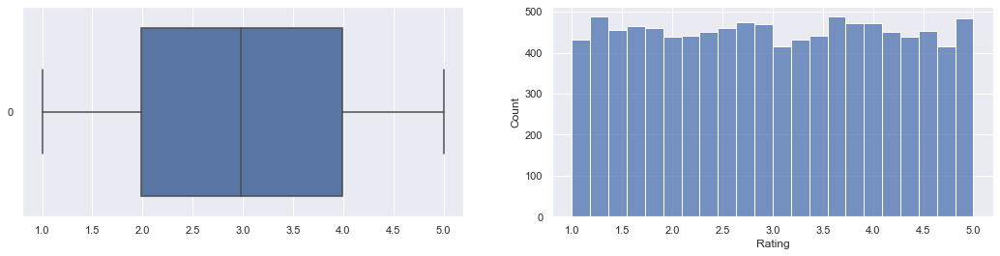

In [23]:
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = salesdata['Rating'], orient = "h", ax = axes[0])
sb.histplot(data = salesdata['Rating'], ax = axes[1])

Text(0, 0.5, 'Y Axis Label')

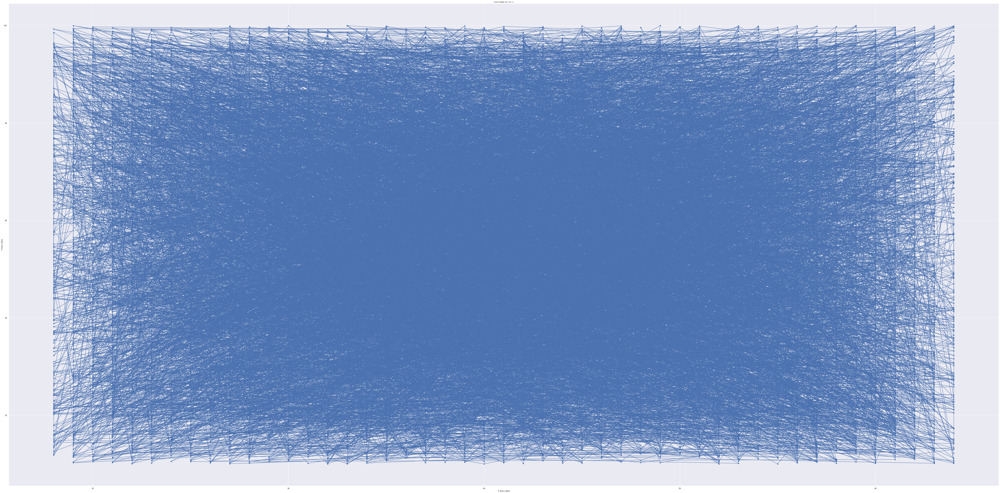

In [26]:


plt.figure(figsize=(100, 5))  # Set the figure size as desired
plt.plot(salesdata["Age"], salesdata["Price"], marker='o')  # 'marker' specifies the marker style

plt.title('Line Graph of y vs. x')  # Replace with your title
plt.xlabel('X Axis Label')  # Replace with your x-axis label
plt.ylabel('Y Axis Label')  # Replace with your y-axis label


In [31]:
#exploring the buying trends of sub categories
#explore based on the deason
summer=salesdata[(salesdata['Season']=='Summer')]
winter=salesdata[(salesdata['Season']=='Winter')]
winter_fall=salesdata[(salesdata['Season']=='Fall/Winter')]

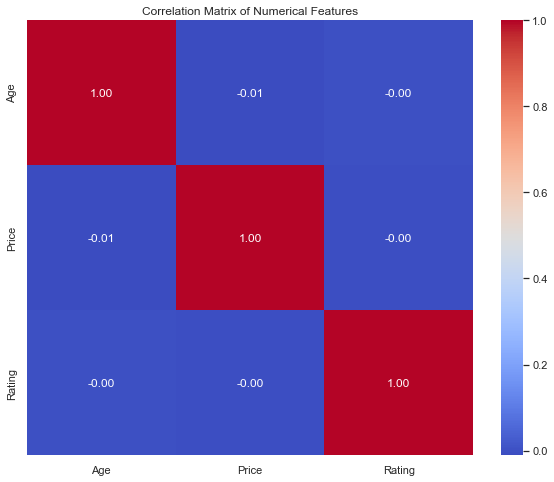

In [34]:
correlation_matrix = salesdata[['Age', 'Price', 'Rating']].corr()

# Plot the correlation matrix using seaborn
plt.figure(figsize=(10, 8))
sb.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()

In [ ]:
#no clear correlations between any of the numeric variables

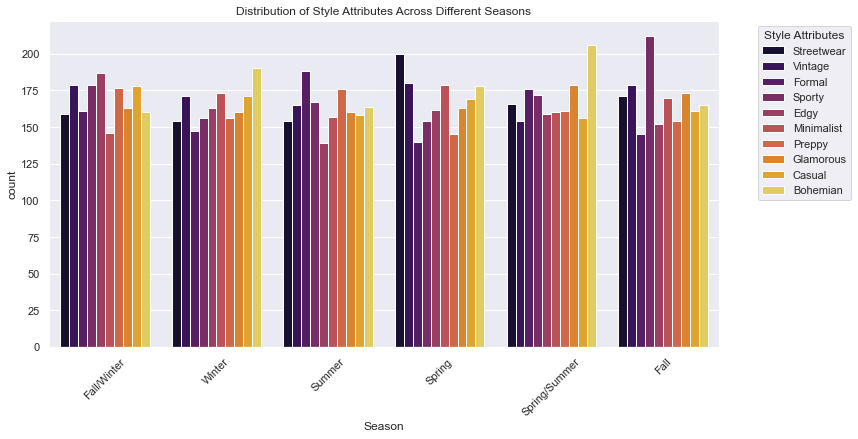

In [36]:
plt.figure(figsize=(12, 6))
sb.countplot(data=salesdata, x='Season', hue='Style Attributes', palette='inferno')
plt.title('Distribution of Style Attributes Across Different Seasons')
plt.legend(title='Style Attributes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

In [38]:
style_counts = salesdata.groupby(['Season', 'Style Attributes']).size().reset_index(name='Counts')

# Find the most prevalent style attribute in each season
most_prevalent_style = style_counts.loc[style_counts.groupby('Season')['Counts'].idxmax()]

# Display the most prevalent style attributes and their counts for each season
print("Most Prevalent Style Attributes by Season:")
print(most_prevalent_style)

# Additionally, if you want a complete summary table of counts per style attribute across each season
complete_summary = style_counts.pivot(index='Style Attributes', columns='Season', values='Counts').fillna(0)
print("\nComplete Summary of Style Attribute Counts by Season:")
print(complete_summary)

Most Prevalent Style Attributes by Season:
           Season Style Attributes  Counts
7            Fall           Sporty     212
12    Fall/Winter             Edgy     187
28         Spring       Streetwear     200
30  Spring/Summer         Bohemian     206
43         Summer           Formal     188
50         Winter         Bohemian     190

Complete Summary of Style Attribute Counts by Season:
Season            Fall  Fall/Winter  Spring  Spring/Summer  Summer  Winter
Style Attributes                                                          
Bohemian           165          160     178            206     164     190
Casual             161          178     169            156     158     171
Edgy               152          187     162            159     139     163
Formal             145          161     140            176     188     147
Glamorous          173          163     163            179     160     160
Minimalist         170          146     179            160     157     173
P

In [ ]:
#there are some trends with the styles during each season but they are not very clear.


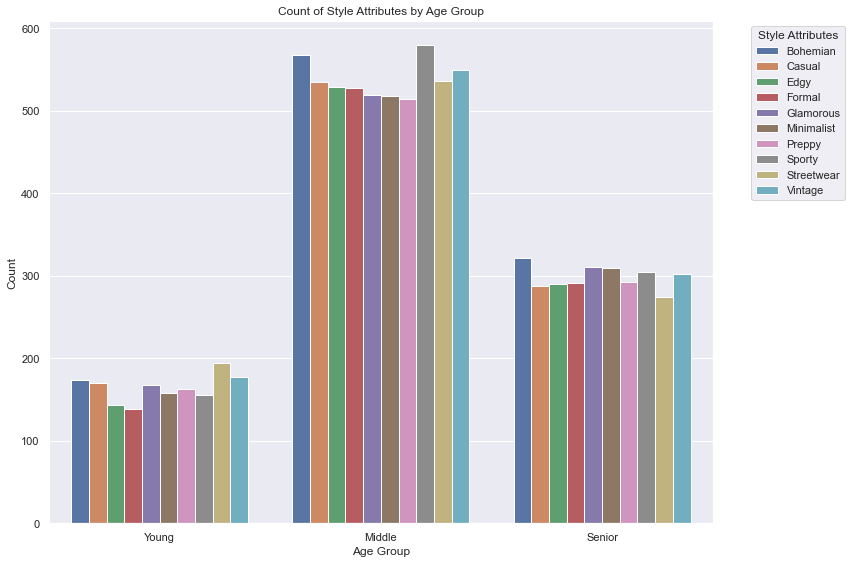

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb


# Define the age groups
bins = [0, 25, 50, salesdata['Age'].max()]
labels = ['Young', 'Middle', 'Senior']
salesdata['Age_Group'] = pd.cut(salesdata['Age'], bins=bins, labels=labels, include_lowest=True)

# Group the data by 'Age_Group' and 'Style Attributes' and count the occurrences
age_style_counts = salesdata.groupby(['Age_Group', 'Style Attributes']).size().reset_index(name='Counts')

# Create a bar plot
plt.figure(figsize=(12, 8))
sb.barplot(data=age_style_counts, x='Age_Group', y='Counts', hue='Style Attributes')
plt.title('Count of Style Attributes by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Style Attributes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout() # Adjust the layout to ensure the legend and labels fit
plt.show()


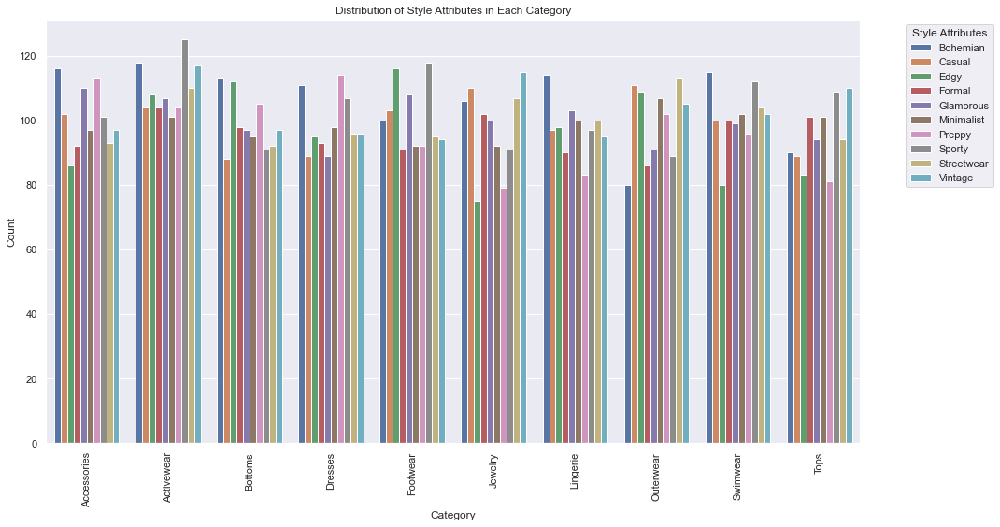

In [47]:



# Group the data by 'Category' and 'Style Attributes' and count the occurrences
category_style_counts = salesdata.groupby(['Category', 'Style Attributes']).size().reset_index(name='Counts')

# Create a bar plot
plt.figure(figsize=(15, 8))  # Adjust the size as needed for your dataset
sb.barplot(data=category_style_counts, x='Category', y='Counts', hue='Style Attributes')
plt.title('Distribution of Style Attributes in Each Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.legend(title='Style Attributes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)  # Rotate the x labels if they overlap
plt.tight_layout()  # Adjust the layout to ensure the legend and labels fit
plt.show()
